## Comparison of NDVI of landsat 8 data pre-, -during- and post fire scenarios

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
from pylab import *
import numpy as np
import rasterio
import pyproj

In [0]:
df = pd.read_csv('data/scene_sandiego.csv')
df = df[df.cloudCover < 50]
df.shape

(161, 13)

In [0]:
df=df.sort_values(by=['acquisitionDate'])
df.head(4)

,Unnamed: 0,productId,entityId,acquisitionDate,cloudCover,processingLevel,path,row,min_lat,min_lon,max_lat,max_lon,download_url
77,710154,LC08_L1TP_040037_20130319_20170310_01_T1,LC80400372013078LGN02,2013-03-19 18:21:21.283641,22.81,L1TP,40,37,32.16535,-117.83868,34.16618,-115.46220,https://s3-us-west-2.amazonaws.com/landsat-pds...
78,713840,LO08_L1TP_040037_20130406_20170310_01_T1,LO80400372013096LGN02,2013-04-06 18:25:58.083569,2.18,L1TP,40,37,32.15951,-118.81826,34.16369,-116.40709,https://s3-us-west-2.amazonaws.com/landsat-pds...
80,721593,LC08_L1TP_040037_20130420_20170310_01_T1,LC80400372013110LGN03,2013-04-20 18:24:20.558903,0.36,L1TP,40,37,32.16741,-118.38869,34.16390,-115.94572,https://s3-us-west-2.amazonaws.com/landsat-pds...
81,731814,LC08_L1TP_040037_20130522_20170310_01_T1,LC80400372013142LGN03,2013-05-22 18:24:35.364850,29.36,L1TP,40,37,32.16696,-118.43099,34.16341,-115.98390,https://s3-us-west-2.amazonaws.com/landsat-pds...


In [0]:
#raster processing reference - https://geohackweek.github.io/raster/04-workingwithrasters/
def getband(url, bandfile):
   
    with rasterio.open(url+bandfile) as src:
        profile = src.profile
        oviews = src.overviews(1) # list of overviews from biggest to smallest
        oview = oviews[1]  # Use second-highest resolution overview
        #print('Decimation factor= {}'.format(oview))
        band = src.read(1, out_shape=(1, int(src.height // oview), int(src.width // oview)))
        band = band.astype('f4')
        band[band==0] = np.nan
    return band, oview



 
def saveband(url, bandfile, localname):
    band, _ = getband(url, bandfile)
    return band
    with rasterio.open(url+bandfile) as src:
        profile = src.profile.copy()

       # aff = src.transform
       # newaff = rasterio.Affine(aff.a * oview, aff.b, aff.c,
       #                      aff.d, aff.e * oview, aff.f)
        profile.update({
            'dtype': 'float32',
            'height': band.shape[0],
            'width': band.shape[1]})
            #'transform': newaff}
             
   # with rasterio.open(localname, 'w', **profile) as dst:
       #     dst.write_band(1, band)
    return band

def saveband(url, bandfile, localname, save=1):
    band, oview = getband(url, bandfile)
    
    with rasterio.open(url+bandfile) as src:
        profile = src.profile.copy()

        aff = src.transform
        newaff = rasterio.Affine(aff.a * oview, aff.b, aff.c,
                             aff.d, aff.e * oview, aff.f)
        profile.update({
            'dtype': 'float32',
            'height': band.shape[0],
            'width': band.shape[1],
            'transform': newaff})
             
    with rasterio.open(localname, 'w', **profile) as dst:
            dst.write_band(1, band)
    return band

def calc_ndvi(nir,red):
    '''Calculate NDVI from integer arrays'''
    nir = nir.astype('f4')
    red = red.astype('f4')
    ndvi = (nir - red) / (nir + red)
    return ndvi

def calc_evi(nir, red, blue):
   # EVI = G * ((NIR - R) / (NIR + C1 * R – C2 * B + L))
    g = 2.5
    c1 = 6
    c2 = 7.5
    l = 1
    
    evi = g * ((nir - red) / (nir + c1 * red - c2 * blue + l))
    return evi

def calc_ndvi_latlong(ndvi, localname, latitude, longitude):
    with rasterio.open(localname) as src:
        # Use pyproj to convert point coordinates
        utm = pyproj.Proj(src.crs) # Pass CRS of image from rasterio
        lonlat = pyproj.Proj(init='epsg:4326')

        #lon,lat = (-117.16, 32.71)
        lon,lat = (longitude, latitude)
        east,north = pyproj.transform(lonlat, utm, lon, lat)

        print('San Diego NDVI\n-------')
        print(f'lon,lat=\t\t({lon:.2f},{lat:.2f})')
        print(f'easting,northing=\t({east:g},{north:g})')

        # What is the corresponding row and column in our image?
        row, col = src.index(east, north) # spatial --> image coordinates
        print(f'row,col=\t\t({row},{col})')

        # What is the NDVI?
        value = ndvi[row, col]
        print(f'ndvi=\t\t\t{value:.2f}')
    return value

def calc_ndvi_rowcol(ndvi, localname, row, col):
    with rasterio.open(localname) as src:
        # Use pyproj to convert point coordinates
        utm = pyproj.Proj(src.crs) # Pass CRS of image from rasterio
        lonlat = pyproj.Proj(init='epsg:4326')

        row, col = row, col
        east, north = src.xy(row,col) # image --> spatial coordinates
        lon,lat = pyproj.transform(utm, lonlat, east, north)
        value = ndvi[row, col]
        print(f'''
            Interesting Feature
            -------
            row,col=          ({row},{col})
            easting,northing= ({east:g},{north:g})
            lon,lat=          ({lon:.2f},{lat:.2f})
            ndvi=              {value:.2f}
            ''')
    return value
    
def calc_ndvi_point(ndvi, localname, latlong=True):
    with rasterio.open(localname) as src:
        # Use pyproj to convert point coordinates
        utm = pyproj.Proj(src.crs) # Pass CRS of image from rasterio
        lonlat = pyproj.Proj(init='epsg:4326')

        lon,lat = (-117.16, 32.71)
        east,north = pyproj.transform(lonlat, utm, lon, lat)

        print('San Diego NDVI\n-------')
        print(f'lon,lat=\t\t({lon:.2f},{lat:.2f})')
        print(f'easting,northing=\t({east:g},{north:g})')

        # What is the corresponding row and column in our image?
        row, col = src.index(east, north) # spatial --> image coordinates
        print(f'row,col=\t\t({row},{col})')

        # What is the NDVI?
        value = ndvi[row, col]
        print(f'ndvi=\t\t\t{value:.2f}')


        # Or if you see an interesting feature and want to know the spatial coordinates:
        row, col = 200, 450
        east, north = src.xy(row,col) # image --> spatial coordinates
        lon,lat = pyproj.transform(utm, lonlat, east, north)
        value = ndvi[row, col]
        print(f'''
            Interesting Feature
            -------
            row,col=          ({row},{col})
            easting,northing= ({east:g},{north:g})
            lon,lat=          ({lon:.2f},{lat:.2f})
            ndvi=              {value:.2f}
            ''')
        return value


In [0]:
rowcol = [(600,200),(200,450),()]



In [0]:
import sys

i = 1
df_ndvi =  pd.DataFrame(columns=['date', 'shortdesc', 'ndvi', 'ndvi_point','mode','x1','y1', 'cloudcover', 'localname'])
#df_evi =  pd.DataFrame(columns=['date', 'evi', 'evi_point', 'cloudcover', 'localname'])
rowcol = [(600,200),(200,450),(400,500)]
latlong = []
for item in df.itertuples():
    #print(item)
    
    url = item.download_url.split("/index.html")[0]
    filename = url.split("/")[-1]
    url = url+"/"
    redband = filename+'_B{}.TIF'.format(4)
    #blueband = filename+'_B{}.TIF'.format(2)
    nirband = filename+'_B{}.TIF'.format(5)
    #thermalband = filename+'_B{}.TIF'.format(10)
    #swirband = filename+'_B{}.TIF'.format(6)
    
    try:
        localname = 'data/tifs/red/'+redband
        red = saveband(url, redband, localname)
        print("red:{}".format(i))
        
        #localname = 'data/tifs/red/'+blueband
        #blue = saveband(url, blueband, localname)
        #print("blue:{}".format(i))
    
        localname = 'data/tifs/nir/'+nirband
        nir = saveband(url, nirband, localname)
        print("nir:{}".format(i))
        
        ndvi = calc_ndvi(nir, red)
        print("ndvi:{}".format(i))
        saveband(url, nirband, localname, save=1)
        
        for t in rowcol:
            ndvi_point = calc_ndvi_rowcol(ndvi, localname, t[0], t[1])
            data = [[item.acquisitionDate.split(" ")[0], "", ndvi, ndvi_point, 'rowcol', t[0], t[1], item.cloudCover, localname]]
            df_temp = pd.DataFrame(data=data,columns=['date', 'shortdesc', 'ndvi', 'ndvi_point','mode','x1','y1', 'cloudcover', 'localname'])
            df_ndvi = df_ndvi.append(df_temp)
        
        #evi = calc_evi(nir, red, blue)
        
        #print("evi:{}".format(i))
        
        #evi_point = calc_ndvi_point(evi, localname)
        #data = [[item.acquisitionDate.split(" ")[0], evi, evi_point, item.cloudCover, localname]]
        #df_temp1 = pd.DataFrame(data=data,columns=['date', 'evi', 'evi_point', 'cloudcover', 'localname'])
        #df_evi = df_evi.append(df_temp1)
        
        #localname = 'data/tifs/swir/'+swirband
       # saveband(url, swirband, localname)
        #print("swir:{}".format(i))
    
        #localname = 'data/tifs/thermal/'+thermalband
        #thermal = saveband(url, thermalband, localname)
        #print("thermal:{}".format(i))
    except Exception as e:
        print(sys.exc_info()[0],"occured.")
        print(e)
        
    
        
    i=i+1

red:1
nir:1
ndvi:1

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (476820,3.61878e+06)
            lon,lat=          (-117.25,32.71)
            ndvi=              0.13
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (544320,3.72678e+06)
            lon,lat=          (-116.52,33.68)
            ndvi=              0.09
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (557820,3.67278e+06)
            lon,lat=          (-116.38,33.19)
            ndvi=              0.08
            
red:2
nir:2
ndvi:2

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (386520,3.61968e+06)
            lon,lat=          (-118.21,32.71)
            ndvi=              -0.05
            

    

red:13
nir:13
ndvi:13

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (424320,3.62568e+06)
            lon,lat=          (-117.81,32.77)
            ndvi=              -0.04
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (491820,3.73368e+06)
            lon,lat=          (-117.09,33.74)
            ndvi=              0.09
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (505320,3.67968e+06)
            lon,lat=          (-116.94,33.26)
            ndvi=              0.04
            
red:14
nir:14
ndvi:14

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (422520,3.62568e+06)
            lon,lat=          (-117.83,32.77)
            ndvi=              -0.04
           

red:25
nir:25
ndvi:25

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (421020,3.62568e+06)
            lon,lat=          (-117.84,32.77)
            ndvi=              -0.04
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (488520,3.73368e+06)
            lon,lat=          (-117.12,33.74)
            ndvi=              0.09
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (502020,3.67968e+06)
            lon,lat=          (-116.98,33.26)
            ndvi=              0.21
            
red:26
nir:26
ndvi:26

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (424920,3.62568e+06)
            lon,lat=          (-117.80,32.77)
            ndvi=              -0.07
           

red:37
nir:37
ndvi:37

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (423420,3.62568e+06)
            lon,lat=          (-117.82,32.77)
            ndvi=              -0.01
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (490920,3.73368e+06)
            lon,lat=          (-117.10,33.74)
            ndvi=              0.09
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (504420,3.67968e+06)
            lon,lat=          (-116.95,33.26)
            ndvi=              0.11
            
red:38
nir:38
ndvi:38

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (424020,3.62568e+06)
            lon,lat=          (-117.81,32.77)
            ndvi=              -0.04
           

red:49
nir:49
ndvi:49

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (425520,3.62568e+06)
            lon,lat=          (-117.80,32.77)
            ndvi=              -0.04
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (493020,3.73368e+06)
            lon,lat=          (-117.08,33.74)
            ndvi=              0.15
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (506520,3.67968e+06)
            lon,lat=          (-116.93,33.26)
            ndvi=              0.15
            
red:50
nir:50
ndvi:50

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (424020,3.62568e+06)
            lon,lat=          (-117.81,32.77)
            ndvi=              -0.04
           

red:61
nir:61
ndvi:61

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (424320,3.62568e+06)
            lon,lat=          (-117.81,32.77)
            ndvi=              -0.05
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (491820,3.73368e+06)
            lon,lat=          (-117.09,33.74)
            ndvi=              0.11
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (505320,3.67968e+06)
            lon,lat=          (-116.94,33.26)
            ndvi=              0.16
            
red:62
nir:62
ndvi:62

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (425220,3.62568e+06)
            lon,lat=          (-117.80,32.77)
            ndvi=              -0.05
           

red:73
nir:73
ndvi:73

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (422820,3.62568e+06)
            lon,lat=          (-117.82,32.77)
            ndvi=              0.03
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (490320,3.73368e+06)
            lon,lat=          (-117.10,33.74)
            ndvi=              0.21
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (503820,3.67968e+06)
            lon,lat=          (-116.96,33.26)
            ndvi=              0.21
            
red:74
nir:74
ndvi:74

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (421920,3.62568e+06)
            lon,lat=          (-117.83,32.77)
            ndvi=              -0.05
            

red:85
nir:85
ndvi:85

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (425220,3.62568e+06)
            lon,lat=          (-117.80,32.77)
            ndvi=              0.00
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (492720,3.73368e+06)
            lon,lat=          (-117.08,33.74)
            ndvi=              0.17
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (506220,3.67968e+06)
            lon,lat=          (-116.93,33.26)
            ndvi=              0.21
            
red:86
nir:86
ndvi:86

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (425220,3.62568e+06)
            lon,lat=          (-117.80,32.77)
            ndvi=              0.00
            


red:97
nir:97
ndvi:97

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (424020,3.62568e+06)
            lon,lat=          (-117.81,32.77)
            ndvi=              -0.05
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (491520,3.73368e+06)
            lon,lat=          (-117.09,33.74)
            ndvi=              0.13
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (505020,3.67968e+06)
            lon,lat=          (-116.95,33.26)
            ndvi=              0.17
            
red:98
nir:98
ndvi:98

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (424020,3.62568e+06)
            lon,lat=          (-117.81,32.77)
            ndvi=              -0.05
           

red:109
nir:109
ndvi:109

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (421920,3.62568e+06)
            lon,lat=          (-117.83,32.77)
            ndvi=              -0.04
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (489420,3.73368e+06)
            lon,lat=          (-117.11,33.74)
            ndvi=              0.08
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (502920,3.67968e+06)
            lon,lat=          (-116.97,33.26)
            ndvi=              0.13
            
red:110
nir:110
ndvi:110

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (421920,3.62568e+06)
            lon,lat=          (-117.83,32.77)
            ndvi=              -0.04
     


            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (424320,3.62568e+06)
            lon,lat=          (-117.81,32.77)
            ndvi=              -0.05
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (491820,3.73368e+06)
            lon,lat=          (-117.09,33.74)
            ndvi=              0.12
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (505320,3.67968e+06)
            lon,lat=          (-116.94,33.26)
            ndvi=              0.02
            
red:121
nir:121
ndvi:121

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (422520,3.62568e+06)
            lon,lat=          (-117.83,32.77)
            ndvi=              -0.05
            

            Inte

red:132
nir:132
ndvi:132

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (425220,3.62568e+06)
            lon,lat=          (-117.80,32.77)
            ndvi=              -0.04
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (492720,3.73368e+06)
            lon,lat=          (-117.08,33.74)
            ndvi=              0.02
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (506220,3.67968e+06)
            lon,lat=          (-116.93,33.26)
            ndvi=              0.14
            
red:133
nir:133
ndvi:133

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (426120,3.62568e+06)
            lon,lat=          (-117.79,32.77)
            ndvi=              -0.04
     


            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (423720,3.62568e+06)
            lon,lat=          (-117.81,32.77)
            ndvi=              -0.04
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (491220,3.73368e+06)
            lon,lat=          (-117.09,33.74)
            ndvi=              0.10
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (504720,3.67968e+06)
            lon,lat=          (-116.95,33.26)
            ndvi=              0.06
            
red:144
nir:144
ndvi:144

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (423720,3.62568e+06)
            lon,lat=          (-117.81,32.77)
            ndvi=              -0.04
            

            Inte

red:155
nir:155
ndvi:155

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (422220,3.62568e+06)
            lon,lat=          (-117.83,32.77)
            ndvi=              -0.03
            

            Interesting Feature
            -------
            row,col=          (200,450)
            easting,northing= (489720,3.73368e+06)
            lon,lat=          (-117.11,33.74)
            ndvi=              0.16
            

            Interesting Feature
            -------
            row,col=          (400,500)
            easting,northing= (503220,3.67968e+06)
            lon,lat=          (-116.97,33.26)
            ndvi=              0.20
            
red:156
nir:156
ndvi:156

            Interesting Feature
            -------
            row,col=          (600,200)
            easting,northing= (422220,3.62568e+06)
            lon,lat=          (-117.83,32.77)
            ndvi=              -0.03
     

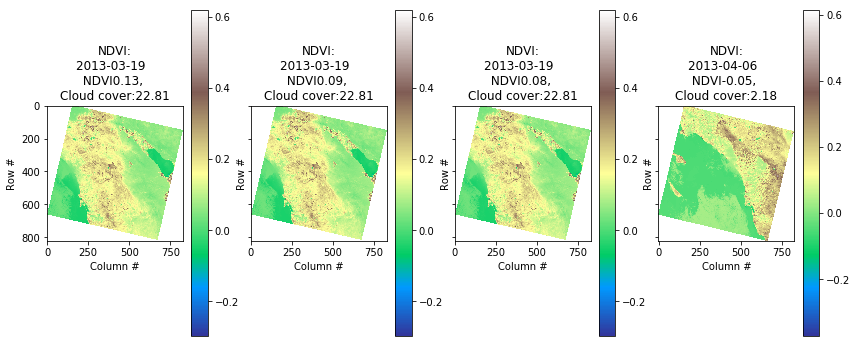

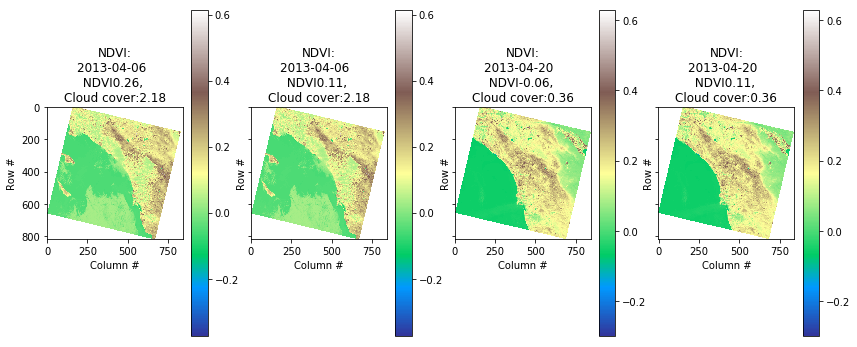

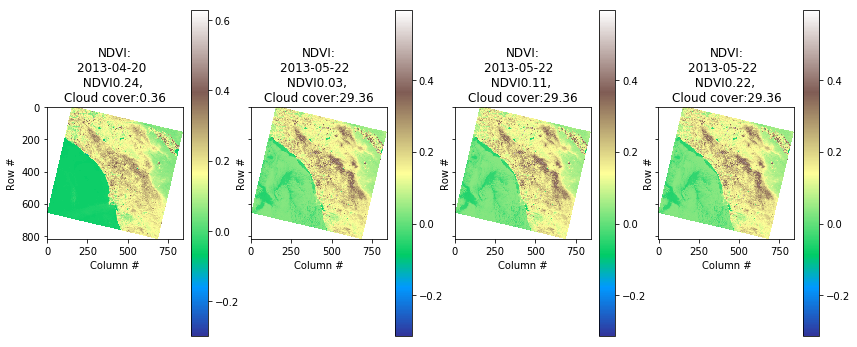

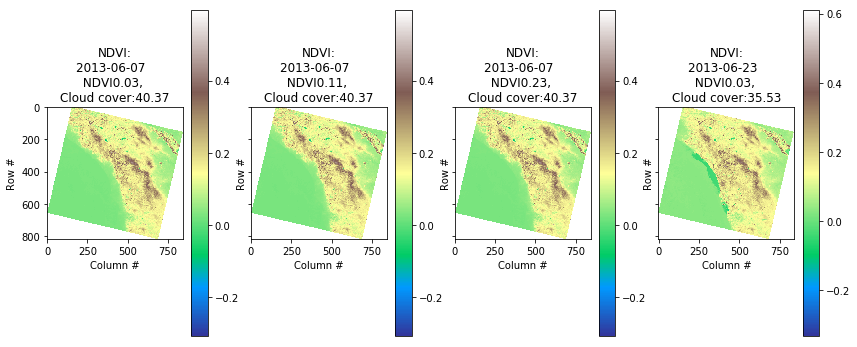

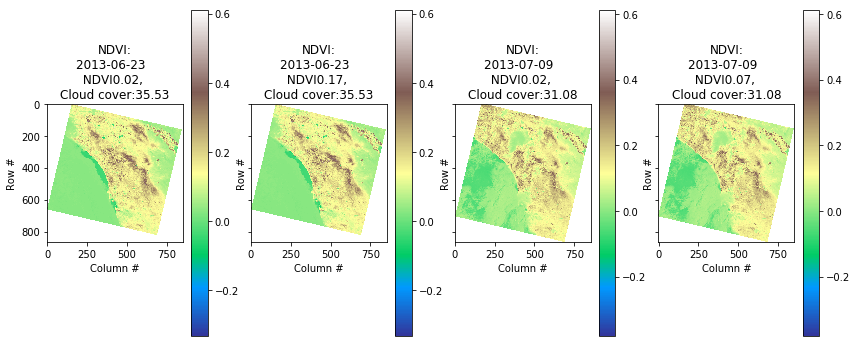

...

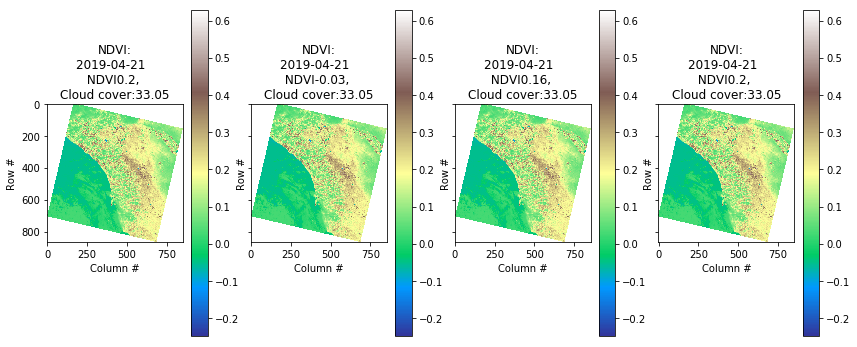

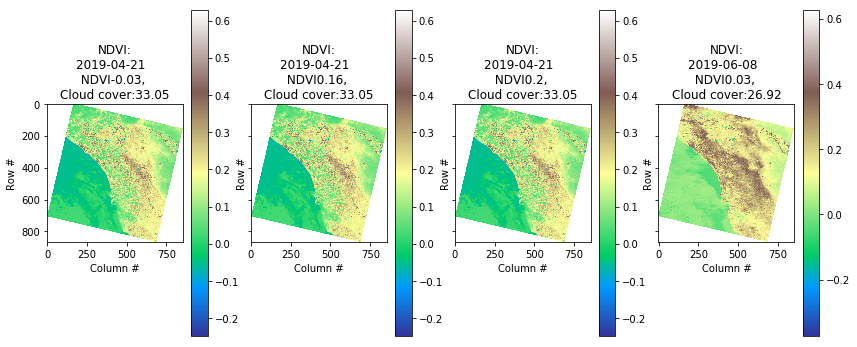

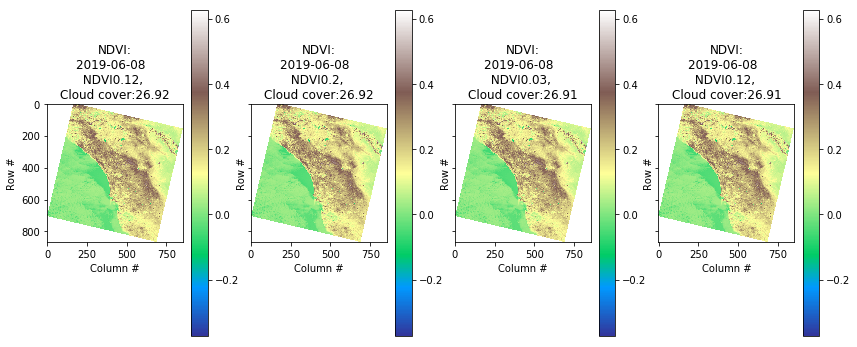

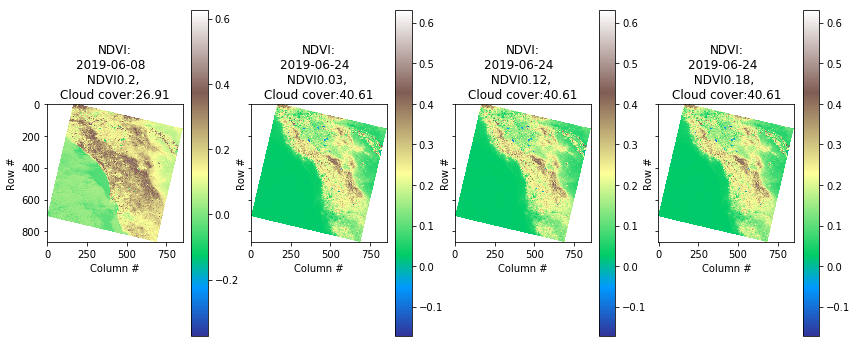

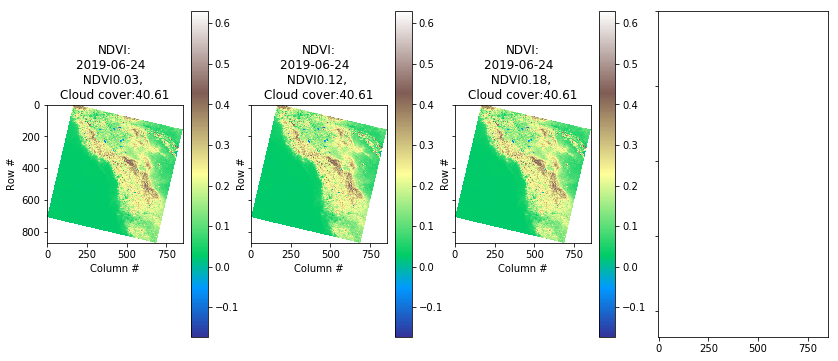

In [0]:
i=1
c=0
j=0
fig, axes = plt.subplots(i,4, figsize=(14,6), sharex=True, sharey=True)
for item in df_ndvi.itertuples():
    if c > 3:
        c=0
        fig, axes = plt.subplots(i,4, figsize=(14,6), sharex=True, sharey=True)
    plt.sca(axes[c])
    plt.imshow(item.ndvi, cmap='terrain')
    plt.colorbar()
    title = "NDVI:\n" + item.date
    plt.title('\n{}  \n NDVI {} ({},{}),  \nCloud cover:{}'.format(title, round(item.ndvi_point, 2), item.x1, item.y1, item.cloudcover))
    plt.xlabel('Column #')
    plt.ylabel('Row #')
    c=c+1
    j=j+1

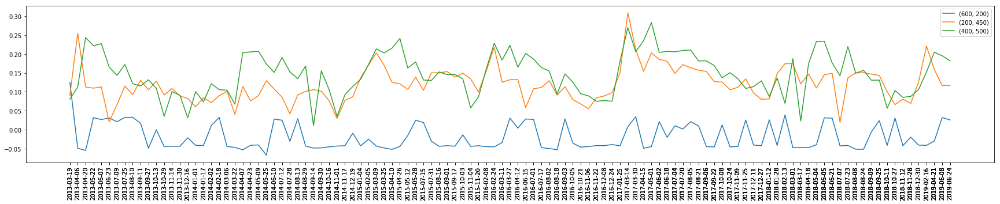

In [0]:
i=1
dfs= []
f, ax = plt.subplots(figsize=(30, 5), sharex=True)
#plt.plot(df_ndvi.date, df_ndvi.ndvi_point);

for i in rowcol:
    dft = df_ndvi[(df_ndvi.x1==i[0]) & (df_ndvi.y1==i[1])]
    plt.plot(dft.date,dft.ndvi_point, label=i)
#for region, df_region in df_ndvi.groupby(['x1', 'y1']):
#    print(df_region.x1,df_region.y1)
#    plt.plot(df_region.date,df_region.ndvi_point, label=str(df_region.x1)+","+str(df_region.y1))

plt.xticks(df_ndvi.date, df_ndvi.date, rotation=90) 
plt.legend()
plt.show()

/Users/nasrajan/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


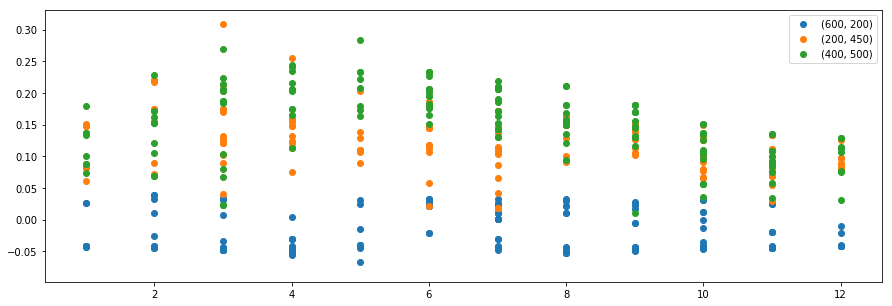

In [0]:
f, ax = plt.subplots(figsize=(15, 5), sharex=True)
#plt.plot(df_ndvi.date, df_ndvi.ndvi_point);

for i in rowcol:
    dft = df_ndvi[(df_ndvi.x1==i[0]) & (df_ndvi.y1==i[1])]
    dft['month'] = dft['date'].map(lambda x : int(x.split("-")[1]) )
    plt.scatter(dft.month,dft.ndvi_point, label=i)
#for region, df_region in df_ndvi.groupby(['x1', 'y1']):
#    print(df_region.x1,df_region.y1)
#    plt.plot(df_region.date,df_region.ndvi_point, label=str(df_region.x1)+","+str(df_region.y1))

#plt.xticks(df_ndvi.date, df_ndvi.date, rotation=90) 
plt.legend()
plt.show()